# Automated Crop Damage Classification for Efficient Agricultural Risk Management.

 **Authors:** `Dominic Mugo`, `Wayne Korir`, & `Celestine Imelda`.
 

## Project Background:

The "Eyes on the Ground" project is a collaborative effort involving ACRE Africa, the Kenya Agricultural & Livestock Research Organization (KALRO), the International Food Policy Research Institute (IFPRI), and the Lacuna Fund. The primary goal of this project is to harness the power of machine learning to enhance the efficiency of insurance claim verification and agricultural advisories for smallholder farmers in Africa.

ACRE Africa, in collaboration with KALRO, currently relies on image data to verify insurance claims and provide personalized agricultural advisories to farmers. The existing manual process of evaluating smartphone pictures of insured crops is time-consuming, leading to delays in claims settlement and increased costs for advisory services.

To address these challenges, the "Eyes on the Ground" project aims to automate image processing through the use of artificial intelligence. Leveraging machine learning algorithms will not only accelerate the claims settlement process but also enable the classification of crops into specific categories based on the type of damage they have suffered. This categorization includes Good growth (G), Drought (DR), Nutrient Deficient (ND), Weed (WD), and Other (including pest, disease, or wind damage).

## Problem Statement:

The current manual process of evaluating images for thousands of insured smallholder farmers is resource-intensive and time-consuming. This process significantly delays claims settlement and increases the overall costs associated with providing agricultural advisories. The need for a more efficient and scalable solution is evident.

The key problems to address include:
- **Manual Verification:** Manual verification of images for insurance claims and advisories is slow and labor-intensive.
- **Processing Costs:** The current process increases the costs of providing advisory services to farmers.
- **Timely Claims Settlement:** Delays in claims settlement impact farmers who depend on insurance payouts for their livelihoods.

## Project Objectives:

**Main Objective:**
The main objective of the "Eyes on the Ground" project is to develop a machine-learning algorithm for the automated classification of crops based on image data, facilitating faster and more accurate verification of insurance claims and providing timely and personalized agricultural advisories.

**Specific Objectives:**

### 1. Model Architecture Design:
   - Design an effective machine-learning model architecture tailored to the crop classification task. Consider using convolutional neural networks (CNNs) or transfer learning with pre-trained models for optimal feature extraction.

### 2. Model Training and Optimization:
   - Train the designed model on the labeled dataset, optimizing hyperparameters to enhance classification performance. Implement techniques such as regularization and dropout to mitigate overfitting and improve generalization.

### 3. Validation and Evaluation:
   - Conduct a comprehensive validation of the trained model using a separate dataset. Evaluate model performance metrics, including accuracy, precision, recall, and F1-score, to assess its effectiveness in classifying crops into predefined categories.

### 4. Deployment:
   - Deploy the trained model to a cloud-based platform, ensuring scalability and accessibility. Implement the necessary infrastructure to handle incoming image data for real-time classification. Provide integration support to seamlessly incorporate the model into the existing workflow of ACRE Africa and KALRO.

By focusing on these specific objectives, your team will play a crucial role in the core aspects of model development, training, validation, and deployment, contributing to the successful implementation of the machine-learning model for crop classification
### 5. Stakeholders
1. ACRE Africa
2. The Kenya Agricultural & Livestock Research Organization (KALRO)
3. The International Food Policy Research Institute (IFPRI)
4.  The Lacuna Fund in the "Eyes on the Ground" project.


# Data Exploration and Understanding

## Overview

Let's begin by exploring and understanding the dataset to gain insights into its structure and characteristics.


## Data Understanding

In [62]:
# import libraries
import os 
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pandas as pd
from PIL import  Image
import seaborn as sns
import pyarrow as pa
import pyarrow.parquet as pq
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, udf
from pyspark.sql.types import ArrayType, IntegerType, StringType
from pyspark.sql import functions as F


# The next 5 lines define the default font sizes
plt.rc('font', size=14)
plt.rc('axes', labelsize=14, titlesize=14)
plt.rc('legend', fontsize=14)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)


# set grid style
sns.set(style="darkgrid")

In [4]:
# read test data
test_data = pd.read_csv('./Test.csv', header=0)

# inspect first five rows of test data
test_data.head()

,ID,filename
0,ID_QW9GQM,03428805a0d7d269b422dbfafb3f86cb394a0491.jpg
1,ID_G9VPQ9,5dcf4f5d82708496ad7c3227ccbc8af5058aa227.jpg
2,ID_QIMIEM,4e835aa40e4aafa24db13cba4182094eb9e5eb79.jpg
3,ID_TSINUQ,1e0dbb8669385be73a480ce108d12bdc4354f120.jpg
4,ID_I7OOHH,3d05e31502f9f00ce25770666c73af5f323a8b3a.jpg


In [5]:
# check shape of test_data
test_data.shape

(8663, 2)

In [6]:
# get basic information on test_data
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8663 entries, 0 to 8662
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   ID        8663 non-null   object
 1   filename  8663 non-null   object
dtypes: object(2)
memory usage: 135.5+ KB


In [7]:
# read training data into a dataframe
training_data = pd.read_csv('./Train.csv', header=0)

# inspect first five entries
training_data.head()

,ID,damage,filename
0,ID_UBHORS,WD,d036341be8d6cd59851cb80bcc9a70cc9fbdba30.jpg
1,ID_9DSOLZ,G,9ea16180c50d0cd539897eefbfe585314e50a56b.jpg
2,ID_JHLM0G,G,b6b564844041bc68774a553eaf43d61654657dd9.jpg
3,ID_ATREIJ,DR,62262859f0cd411aaf484082ed3ef0b625bc452a.jpg
4,ID_L2GAD6,G,03b6e2a8ace7cb611eccba289f3c83d9bd497584.jpg


In [8]:
training_data.shape

(26068, 3)

In [9]:
training_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26068 entries, 0 to 26067
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   ID        26068 non-null  object
 1   damage    26068 non-null  object
 2   filename  26068 non-null  object
dtypes: object(3)
memory usage: 611.1+ KB


### Data Structure

The training datasets consist of the following columns:

- **ID:** A unique identifier for each data entry.
- **Damage:** The type of damage, including categories such as Good (G), Weed (WD), Drought (DR), and others.
- **Filename:** The name of the image file associated with each entry.

Here's a snapshot of the head of the training data:


|    | ID        | Damage | Filename                                     |
|----|-----------|--------|----------------------------------------------|
| 0  | ID_UBHORS | WD     | d036341be8d6cd59851cb80bcc9a70cc9fbdba30.jpg |
| 1  | ID_9DSOLZ | G      | 9ea16180c50d0cd539897eefbfe585314e50a56b.jpg |
| 2  | ID_JHLM0G | G      | b6b564844041bc68774a553eaf43d61654657dd9.jpg |
| 3  | ID_ATREIJ | DR     | 62262859f0cd411aaf484082ed3ef0b625bc452a.jpg |
| 4  | ID_L2GAD6 | G      | 03b6e2a8ace7cb611eccba289f3c83d9bd497584.jpg |

On the other hand, the test set consists only of the **ID:** and **Filename:**  columns:

Below is the head of the test data:


|    | ID        | Filename                                     |
|----|-----------|----------------------------------------------|
| 0  | ID_ABCXYZ | abcxyz.jpg                                   |
| 1  | ID_DEF123 | def123.jpg                                   |
| 2  | ID_XYZ456 | xyz456.jpg                                   |
| 3  | ID_123ABC | 123abc.jpg                                   |
| 4  | ID_ABC456 | abc456.jpg                                   |


### Damage Types

The dataset includes the following damage types (for training data), along with their definitions:

| Damage | Definition          |
|--------|---------------------|
| DR     | Drought             |
| G      | Good (growth)       |
| ND     | Nutrient Deficient  |
| WD     | Weed                |
| other  | Disease, Pest, Wind |

*Note: The test data does not include damage labels; it only contains the ID and filename columns.*


## Data Exploration - Training Data

Since the test data is meant for model evaluation and also due to the limited information in the test set, in our data exploration will focus on the training data.

In [10]:
# image directory
img_dir = './images'

In [11]:
# get a list of all image names in the image directory 
image_names = os.listdir(img_dir)

In [12]:
# distribution of damage types
train_damage_freq = training_data['damage'].value_counts(normalize=True)

train_damage_freq

damage
G        0.445872
WD       0.354381
DR       0.173239
other    0.016073
ND       0.010434
Name: proportion, dtype: float64

In [13]:
def bar_plotter(value_counts, x_label, y_label, plot_title):
    # Plot distribution of types of damage
    
    # create a figure and axis
    fig, ax = plt.subplots(figsize=(10, 8))
    
    # set X and y for our bar chart
    y = value_counts.values
    x = value_counts.index
    
    # plot bar graph 
    bars = ax.bar(height=y, x=x, width=0.6)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.set_title(plot_title)
    
    # add annotations to each bar
    for bar in bars:
        yval = bar.get_height()
        ax.annotate(round(yval, 2), # rounded value
                    xy=(bar.get_x() + bar.get_width() / 2, yval),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')
    


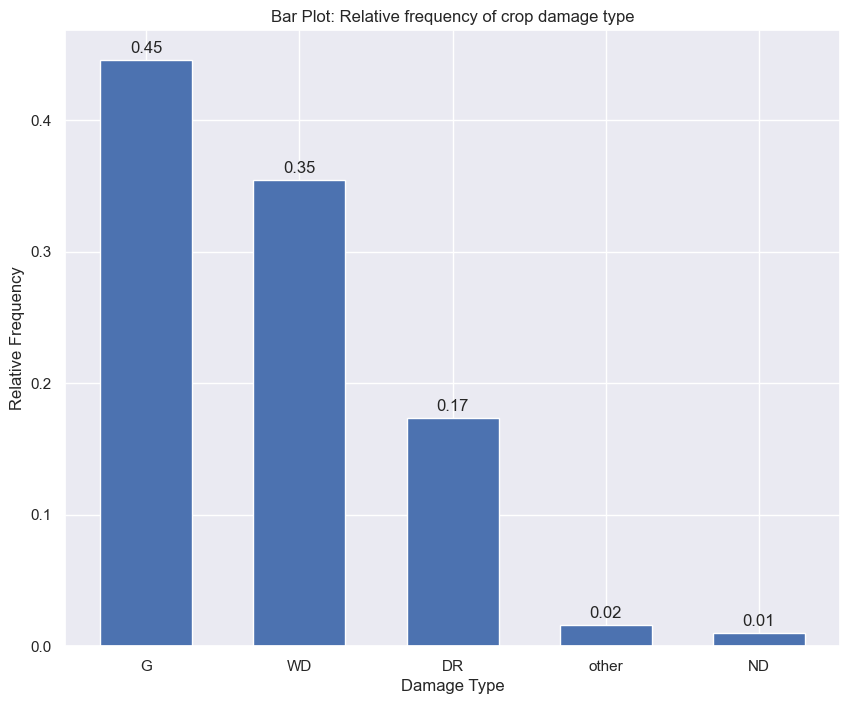

In [14]:
bar_plotter(train_damage_freq, 'Damage Type', 'Relative Frequency', 'Bar Plot: Relative frequency of crop damage type')

### Damage Type Distribution Analysis

#### Observations:

1. **Good (G): 44.59%**
   - The most prevalent damage type, representing a substantial portion of the dataset.

2. **Weed (WD): 35.44%**
   - The second most common category, contributing significantly to the dataset.

3. **Drought (DR): 17.32%**
   - Less frequent than Good and Weed but still a notable portion of the dataset.

4. **Other (Disease, Pest, Wind): 1.61%**
   - A relatively infrequent category, representing a small portion of the dataset.

5. **Nutrient Deficient (ND): 1.04%**
   - Similar to 'Other,' Nutrient Deficient is a less frequent type in# the dataset.



### Sample Images
Let's visualize a few sample images from each damage type to get a visual understanding of the data.


In [15]:
damage_types = {'WD':'Weeds', 'G':'Good Growth', 'DR':'Drought', 
                'ND':'Nutrient Deficiency', 'other':'Other Damage'}

In [16]:
# getting sample of 5 images for each damage type
sample_images = training_data.groupby('damage').sample(4, random_state=42)

In [17]:
def multi_image_plotter(image_dir, image_names, fig_title):
    import matplotlib.image as mpimg

    
    # Set up the subplot grid
    num_images = len(image_names)
    num_cols = 2
    num_rows = (num_images + 1) // num_cols  # Ensure there is at least one row

    # Create a figure and axis
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 12))

    # Flatten the 2D array of subplots if there is only one row
    axes = axes.flatten()

    # Loop through the images and display them in subplots
    for i, image_name in enumerate(image_names):
        img = mpimg.imread(os.path.join(image_dir, image_name))  # Assuming your images are in a directory named "images"
        
        axes[i].imshow(img)
        axes[i].axis('off')  # Turn off axis labels for cleaner display
        axes[i].set_title(f"Image {i + 1}")
    
    # Adjust layout for better spacing and place suptitle
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    fig.suptitle(fig_title, y=0.98)

    plt.show()

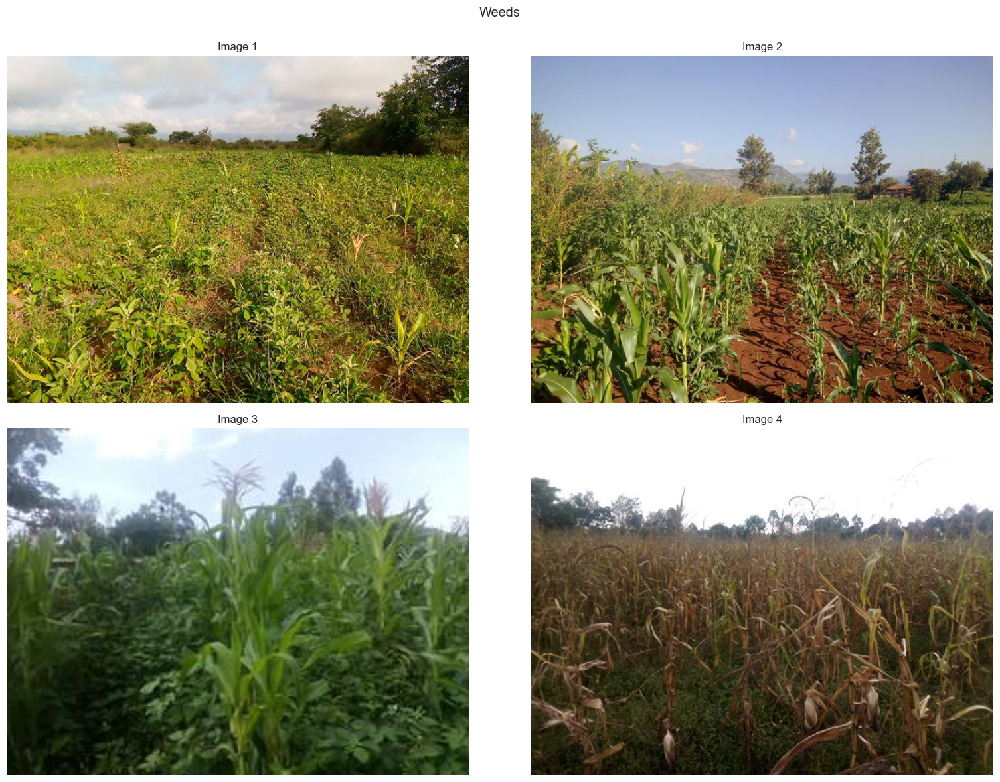

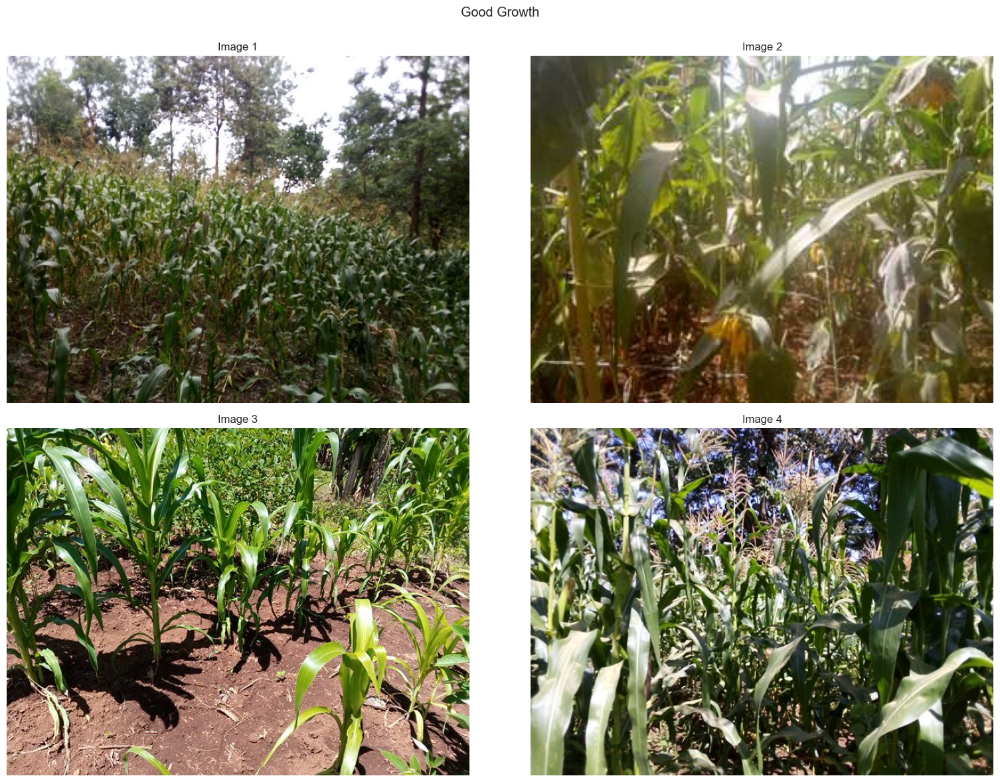

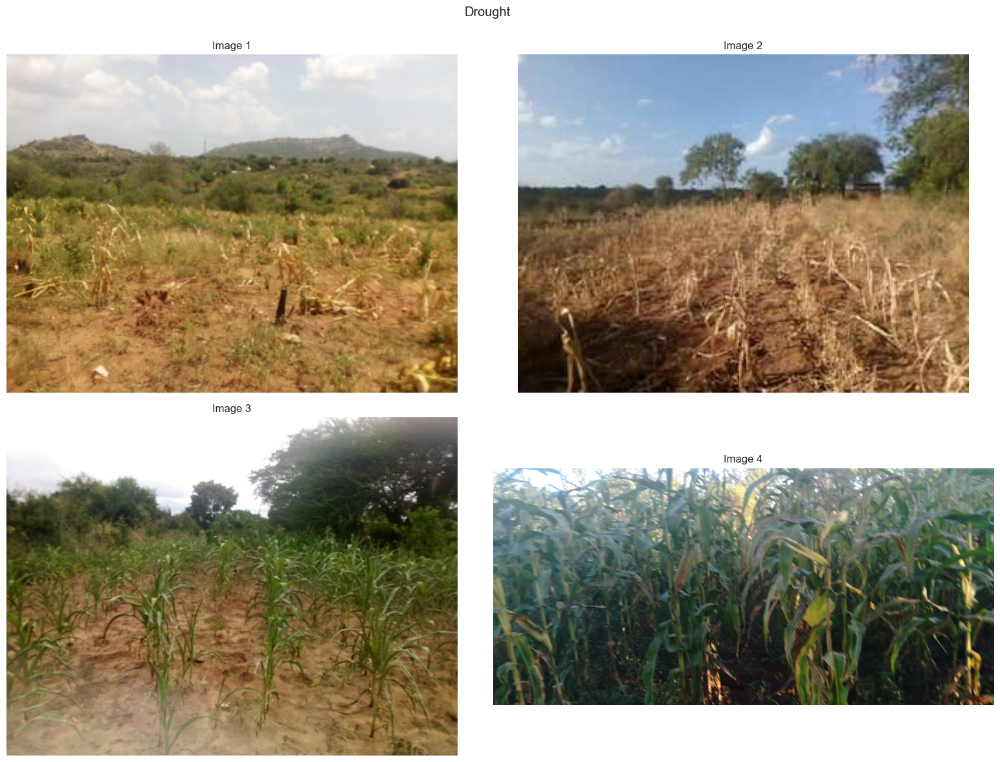

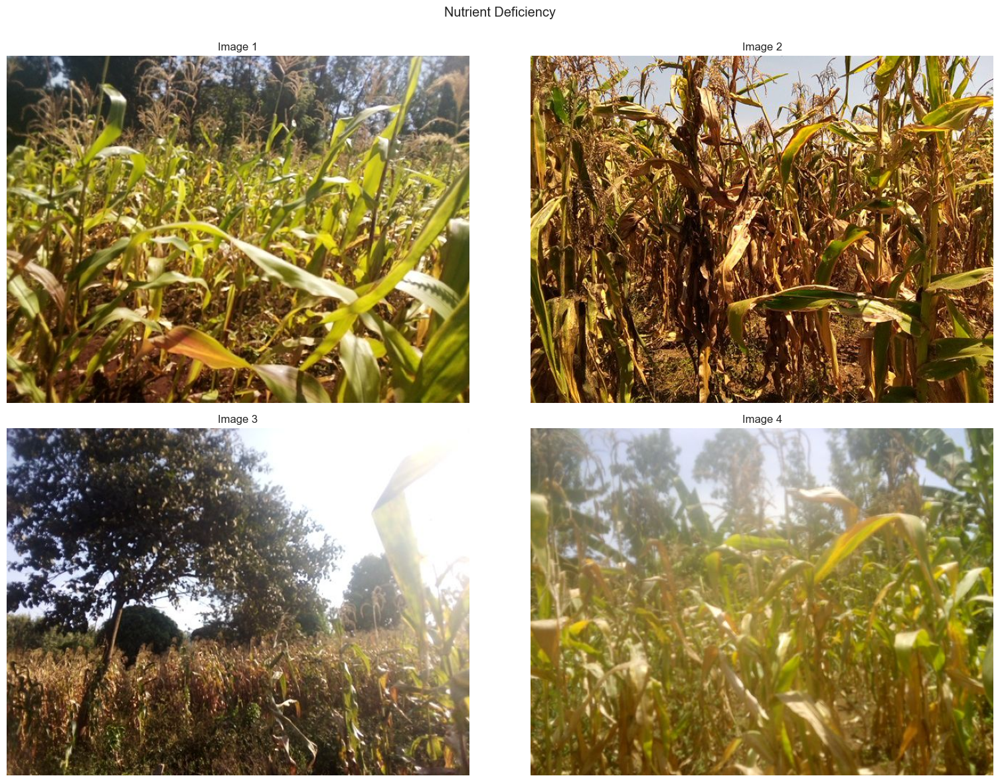

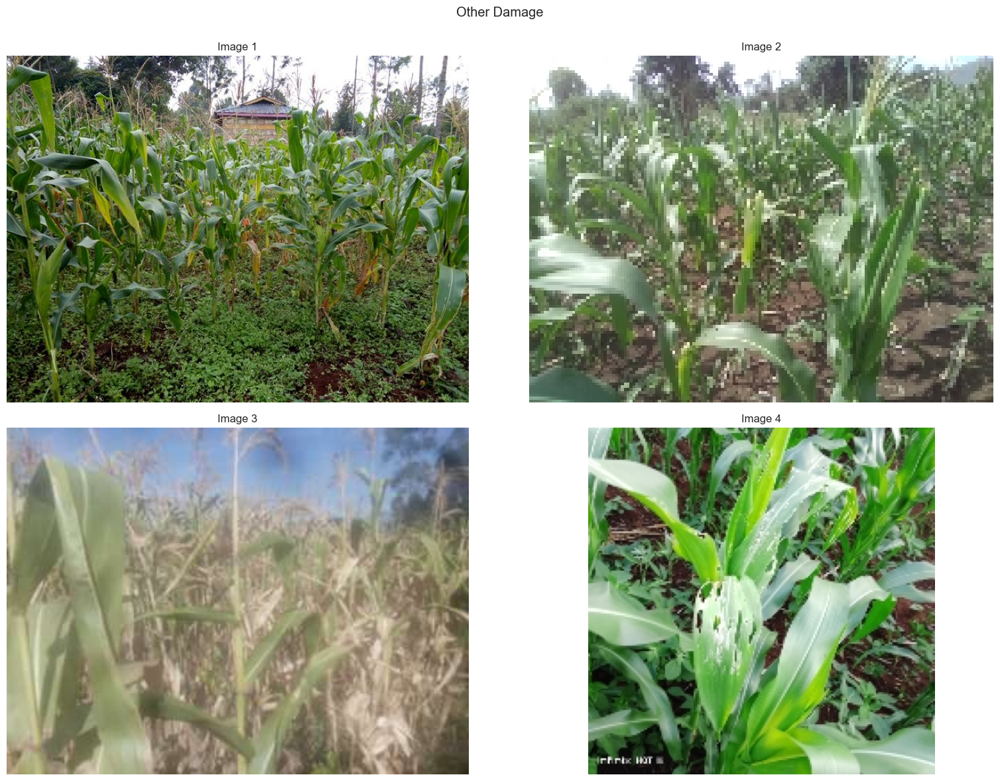

In [18]:
# Visualize images from each damage types
for damage_type_abv, damage_type in damage_types.items():
    image_names = sample_images[sample_images['damage'] == damage_type_abv]['filename']
    multi_image_plotter(img_dir, image_names, damage_type)
    
    

### Image Size & Total Pixels Distribution

In this section, we will investigate the distribution of image sizes and total pixels, providing valuable insights for the data preprocessing step.

Image size refers to the dimensions of an image, typically measured in pixels. It is represented by two values: width and height. For example, an image with a size of 800x600 pixels has a width of 800 pixels and a height of 600 pixels.

**Why is Image Size Important?**

1. **Uniformity in Model Training:** Machine learning models, especially deep learning models, often require input images to have consistent dimensions. A consistent image size ensures that the model can effectively learn patterns and features across the dataset.

2. **Computational Efficiency:** Consistent image sizes can lead to computational efficiency during model training and inference. Batch processing is more streamlined when images have the same dimensions.

3. **Resource Management:** Image size can impact the memory and processing power required for handling the dataset. Understanding the distribution of image sizes helps in efficient resource allocation.

**Total Pixels Distribution**

Total pixels are calculated by multiplying the number of pixels in the width (W) and the number of pixels in the height (H) of each image, using the formula:

$\text{Total Pixels} = \text{Width} \times \text{Height}$



In [19]:
train_image_names = training_data['filename'].values

In [20]:
# generate list of random indices 
import random
random.seed(42)

image_indices = np.random.randint(low=0, 
                                  high=len(train_image_names), 
                                  size=10000)
# randomly select 1000 images from the dataset
random_img_names = [train_image_names[index] for index in image_indices]

# generate file paths for the 100000 selected images
random_img_paths = [os.path.join(img_dir, image_name) for image_name in random_img_names]

# get total pixes of each image and store in a list
# initialize list to store image sizes
sample_image_pixels = []
image_sizes = []
# loop through list of selected image paths
for path in random_img_paths:
    # open image 
    with Image.open(path) as img:
        img_size = img.size # get size of image (300, 300)
        image_sizes.append(img_size)
        total_pixels = img_size[0] * img_size[1] # get total number of pixels in the image
        sample_image_pixels.append(total_pixels) # append total number of pixesl in the image to list

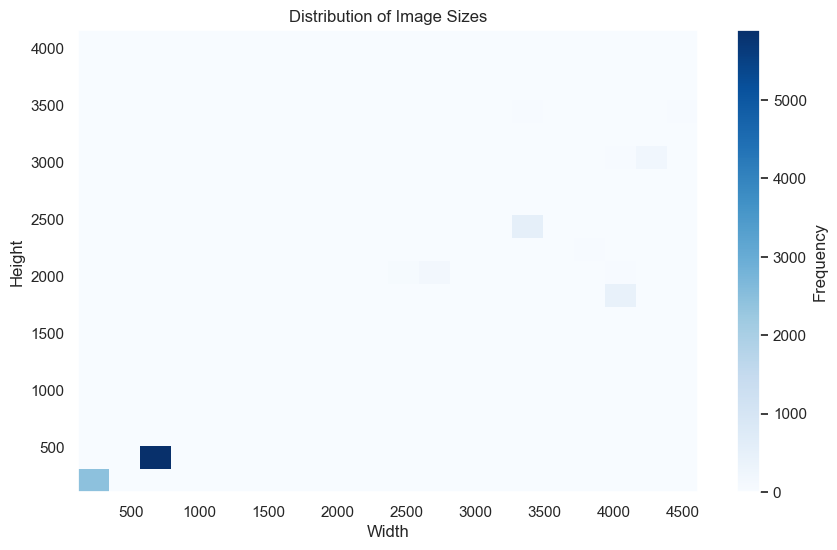

In [21]:
# Extract width and height from tuples
widths, heights = zip(*image_sizes)

# Plotting the histogram
plt.figure(figsize=(10, 6))
plt.hist2d(widths, heights, bins=(20, 20), cmap=plt.cm.Blues)
plt.colorbar(label='Frequency')
plt.xlabel('Width')
plt.ylabel('Height')
plt.title('Distribution of Image Sizes')
plt.show()

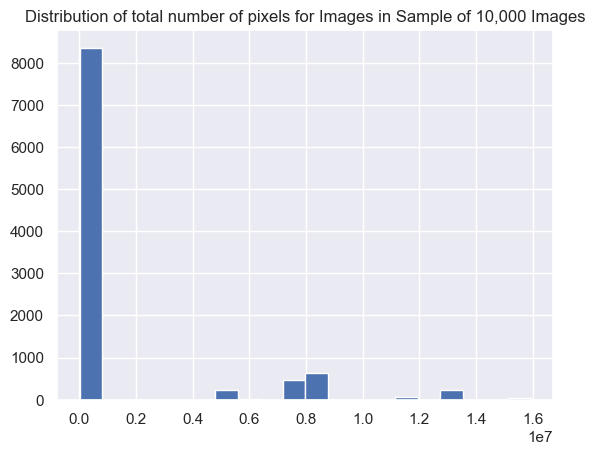

In [22]:
# check the distribution of the number of pixels
plt.hist(sample_image_pixels, bins=20)
plt.title('Distribution of total number of pixels for Images in Sample of 10,000 Images')
plt.show();

In [23]:
majority_images = [pixel for pixel in sample_image_pixels if pixel < 0.2e7]

In [24]:
len(majority_images)

8358

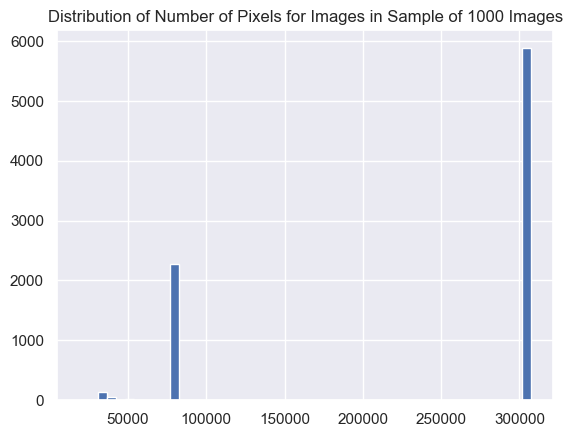

In [25]:
# check the distribution of the number of pixels
plt.hist(majority_images, bins=50)
plt.title('Distribution of Number of Pixels for Images in Sample of 1000 Images')
plt.show();

In [26]:
# Create an empty list to store damage types for randomly selected images
random_damage_type = []

# Iterate through each image name in the list of randomly selected image names
for image_name in random_img_names:
    # Retrieve the damage type for the current image from the training data DataFrame
    # 'training_data' is the DataFrame containing image information
    # and 'filename' is the column containing image names
    damage_type = training_data[training_data['filename'] == image_name].damage.values[0]
    
    # Append the obtained damage type to the list
    random_damage_type.append(damage_type)

# Create a DataFrame with 'damage' and 'pixels' columns using the obtained data
pixels_damage_df = pd.DataFrame({'damage': random_damage_type, 'pixels': sample_image_pixels})

# Display the head of the resulting DataFrame
pixels_damage_df.head()


,damage,pixels
0,G,76800
1,WD,307200
2,WD,15925248
3,G,76800
4,WD,12979200


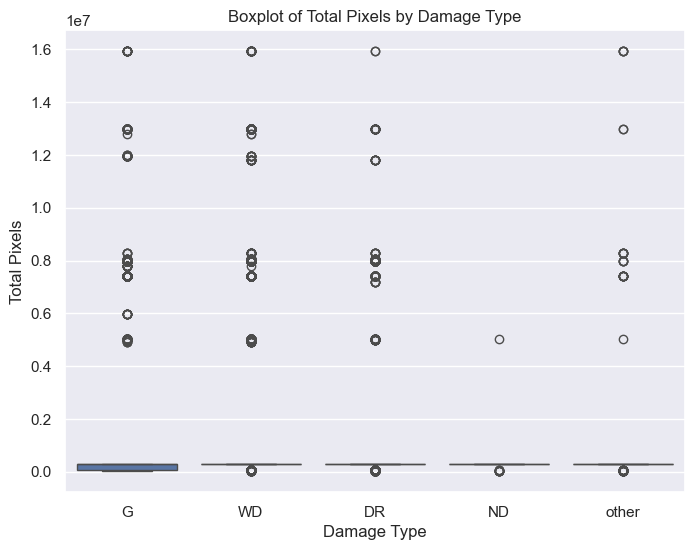

In [27]:
# Create a boxplot for Total Pixels grouped by Damage type
plt.figure(figsize=(8, 6))
sns.boxplot(x='damage', y='pixels', data=pixels_damage_df)
plt.title('Boxplot of Total Pixels by Damage Type')
plt.xlabel('Damage Type')
plt.ylabel('Total Pixels')
plt.show()

In [28]:
# Threshold for filtering out pixels
pixel_threshold = 0.2e7

# Filter out rows where 'pixels' is greater than the threshold
filtered_pixels_damage_df = pixels_damage_df[pixels_damage_df['pixels'] <= pixel_threshold]

# Display the head of the filtered DataFrame
filtered_pixels_damage_df.head()


,damage,pixels
0,G,76800
1,WD,307200
3,G,76800
5,G,76800
6,WD,76800


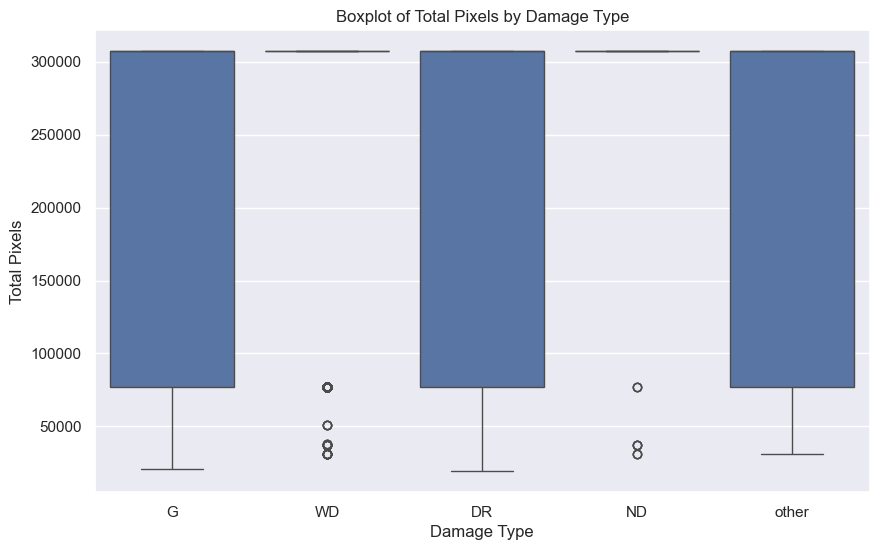

In [29]:
# Create a boxplot for Total Pixels grouped by Damage type
plt.figure(figsize=(10, 6))
sns.boxplot(x='damage', y='pixels', data=filtered_pixels_damage_df)
plt.title('Boxplot of Total Pixels by Damage Type')
plt.xlabel('Damage Type')
plt.ylabel('Total Pixels')
plt.show()

### Image Size Distribution Analysis:

#### Boxplots and Histograms of Total Pixels:

1. **Majority of Images with Low Pixel Count:**
   - Around 80% of the images in the dataset have a total number of pixels less than 400,000. This indicates that the majority of images have relatively low pixel counts.

2. **Concentration of Images around 300,000 Pixels:**
   - Approximately 65% of the images exhibit a total pixel count close to 300,000. This concentration suggests a commonality in image sizes within this range.

#### 2D Histplot Analysis:

1. **Prevalence of (640, 480) Image Size:**
   - The analysis of the dataset revealed that the most common image size is (640, 480), prevalent in more than 60% of the dataset. This indicates a dominant image size in the dataset.

### Insights:

- **Image Size Consistency:** The concentration of images around a specific pixel count, especially the prevalence of (640, 480), suggests a degree of consistency in image sizes within the dataset.

- **Common Image Characteristics:** The prevalence of lower pixel counts and a dominant image size may influence preprocessing decisions and considerations during model training.


In [30]:
0.2e6

200000.0

### Implications for Our Project:

#### 1. Addressing Future Class Imbalance in Damage Types:

**Preprocessing:**
- We will need to address the potential class imbalance to ensure our model generalizes well, especially to edge cases.
- We'll consider oversampling minority classes or undersampling majority classes to balance the class distribution.
- Evaluation metrics will be chosen carefully, taking into account the imbalanced nature of our dataset.

**Modelling Approach:**
- Initially, we plan to run the model without class balancing to assess its performance.
- If we observe poor performance, we intend to implement class balancing techniques in subsequent iterations to improve generalization.

#### 2. Standardizing Image Sizes:

**Preprocessing:**
- Deep learning models are expected to have input images of a standard size for consistent feature extraction.
- A crucial preprocessing step will involve resizing images to a standard size.
- Based on our observations, we plan to choose (640, 480) as our standard image size.

**Modelling Approach:**
- In the future, we will choose (640, 480) as our standard image size.
- Rationale: This size minimizes distortion, preserving more information in our images.
- The selected image size will strike a balance between computational efficiency and information retention.

#### 3. Removing Outliers:

**Preprocessing:**
- We will explore and identify potential outliers in the dataset, particularly in features like total pixels.
- Outliers can be detrimental to model training and may skew results; thus, removal is a necessary preprocessing step.

### Our Future Approach:

Understanding and addressing future class imbalances, standardizing image sizes, and removing outliers are critical for our project's success. These considerations will guide our preprocessing decisions and the overall modeling approach, ensuring our model is robust and capable of handling our dataset effectively.


## Data Cleaning

### Removing outliers


In [31]:
# generate file paths for the 100000 selected images
train_img_paths = [os.path.join(img_dir, image_name) for image_name in train_image_names]

# get total pixes of each image and store in a list
# initialize list to store image sizes
train_total_pixels = []
# loop through list of selected image paths
for path in train_img_paths:
    # open image 
    with Image.open(path) as img:
        img_size = img.size # get size of image (300, 300)
        total_pixels = img_size[0] * img_size[1] # get total number of pixels in the image
        train_total_pixels.append(total_pixels) # append total number of pixesl in the image to list

In [32]:
len(train_total_pixels)

26068

In [33]:
train_img_pixes_df = pd.DataFrame({'image_name':train_image_names, 'total_pixels':train_total_pixels})

train_img_pixes_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26068 entries, 0 to 26067
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   image_name    26068 non-null  object
 1   total_pixels  26068 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 407.4+ KB


### Calculating outlier thresholds


In [34]:
# calculating 

total_pixel_values = train_img_pixes_df['total_pixels'].values

# Calculate Q1 (25th percentile)
Q1 = np.percentile(total_pixel_values, 25)

# Calculate Q3 (75th percentile)
Q3 = np.percentile(total_pixel_values, 75)

# Calculate IQR
IQR = Q3 - Q1

print("Interquartile Range (IQR):", IQR)


Interquartile Range (IQR): 230400.0


In [35]:
len(total_pixel_values)

26068

In [36]:
# Calculate lower and upper thresholds for potential outliers
lower_threshold = Q1 - 1.5 * IQR
upper_threshold = Q3 + 1.5 * IQR

print("Lower Threshold for Outliers:", lower_threshold)
print("Upper Threshold for Outliers:", upper_threshold)


Lower Threshold for Outliers: -268800.0
Upper Threshold for Outliers: 652800.0


In [37]:
# Filter out rows with pixels outside the upper and lower thresholds
filtered_outliers_df = train_img_pixes_df[
    (train_img_pixes_df['total_pixels'] >= lower_threshold) &
    (train_img_pixes_df['total_pixels'] <= upper_threshold)
]

# Display the filtered DataFrame
len(filtered_outliers_df)


21806

In [41]:
filtered_outliers_df.head()

,image_name,total_pixels
0,d036341be8d6cd59851cb80bcc9a70cc9fbdba30.jpg,307200
1,9ea16180c50d0cd539897eefbfe585314e50a56b.jpg,76800
2,b6b564844041bc68774a553eaf43d61654657dd9.jpg,307200
3,62262859f0cd411aaf484082ed3ef0b625bc452a.jpg,307200
4,03b6e2a8ace7cb611eccba289f3c83d9bd497584.jpg,76800


### resize images to (640, 480) and convert them to their matrix
Considering the substantial size of our dataset, approximately ~9GB, processing all the images in memory simultaneously is impractical. As a solution, we have adopted a batch processing approach. This involves systematically processing images in manageable batches, converting them to their resized matrix representations, and subsequently writing the processed data to disk. This method not only allows us to overcome memory limitations but also facilitates efficient handling of the extensive image dataset.


In [72]:
# Output Parquet file
output_parquet_file = "image_matrix_with_names.parquet"

# image names from filtered dataset
filtered_image_names = filtered_outliers_df['image_name'].values

# Batch size for processing images
batch_size = 100  

# Function to convert an image to its matrix representation
def image_to_matrix(image_path, target_size=(640, 480)):
    # Open and resize the image using a context manager
    with Image.open(image_path) as img:
        img_resized = img.resize(target_size)
        
        # Convert the resized image to a matrix
        matrix = np.array(img_resized).flatten()

    # The image is automatically closed when the 'with' block is exited

    return matrix

# Create an empty PyArrow Table to accumulate the matrices and image names
table_schema = pa.schema([("matrix", pa.list_(pa.int64())), ("image_name", pa.string())])
accumulated_table = pa.table({"matrix": [], "image_name": []}, schema=table_schema)

# Process images in batches
for i, file in enumerate(filtered_image_names):
    image_path = os.path.join(img_dir, file)

    # Convert image to matrix representation
    matrix = image_to_matrix(image_path)

    # Append the matrix and image name to the PyArrow Table
    matrix_list = [matrix]  # Convert to a list
    image_name_list = [file]  # Convert to a list

    # Create a temporary table for the current row
    row = pa.table({"matrix": matrix_list, "image_name": image_name_list}, schema=table_schema)

    # Concatenate tables only if accumulated_table is not empty
    if len(accumulated_table) > 0:
        accumulated_table = pa.concat_tables([accumulated_table, row])
    else:
        accumulated_table = row

    # Write the accumulated table to Parquet when batch size is reached
    if i % batch_size == 0:
        pq.write_table(accumulated_table, output_parquet_file, compression="snappy")
        accumulated_table = pa.table({"matrix": [], "image_name": []}, schema=table_schema)

# Write any remaining data in the table to the Parquet file
if len(accumulated_table) > 0:
    pq.write_table(accumulated_table, output_parquet_file, compression="snappy")


KeyboardInterrupt: 

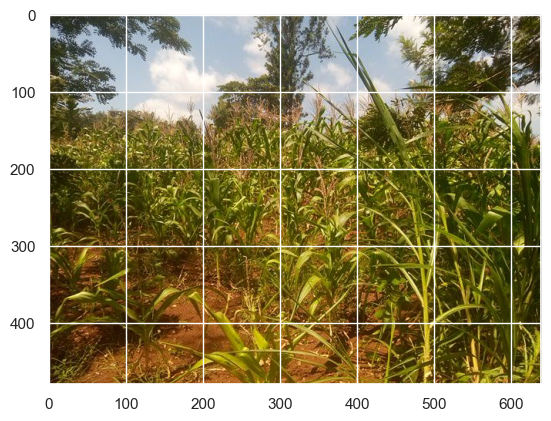

In [71]:
import pyarrow.parquet as pq
import numpy as np
from PIL import Image
import io

# Path to the Parquet file
parquet_file_path = "image_matrix_with_names.parquet"

# Read the Parquet file
table = pq.read_table(parquet_file_path)

# Extract matrices and image names from the PyArrow Table
matrices = table['matrix'].to_numpy()
image_names = table['image_name'].to_numpy()

# Function to display images from their matrix representation
def display_images(matrices, image_names):
    for matrix, image_name in zip(matrices, image_names):
        # Reshape the matrix to the original image dimensions
        image_shape = (480, 640, 3)  # Assuming original image dimensions
        reshaped_matrix = matrix.reshape(image_shape)

        # Convert matrix to image
        image = Image.fromarray(reshaped_matrix.astype('uint8'))

        # Display the image
        plt.imshow(image)

# Display a few images
num_images_to_display = 5
display_images(matrices[:2], image_names[:2])


In [69]:
import pyarrow.parquet as pq

# Specify the path to your Parquet file
parquet_file_path = "image_matrix_with_names.parquet"

# Read the Parquet file into a PyArrow table
table = pq.read_table(parquet_file_path)

# Get the number of rows in the table, which corresponds to the number of images
num_images = table.num_rows
print(f"Number of images: {num_images}")


Number of images: 100
